In [1]:
!pip install shap
!pip install transformers
!pip install nlp
!pip install torch
!pip install scipy

     |████████████████████████████████| 564 kB 5.4 MB/s 
     |████████████████████████████████| 3.3 MB 5.4 MB/s 
     |████████████████████████████████| 61 kB 521 kB/s 
     |████████████████████████████████| 596 kB 46.4 MB/s 
     |████████████████████████████████| 895 kB 45.8 MB/s 
     |████████████████████████████████| 3.3 MB 38.9 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
     |████████████████████████████████| 1.7 MB 5.5 MB/s 
     |████████████████████████████████| 243 kB 47.1 MB/s 


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import shap
import transformers
import nlp
import torch
import numpy as np
import scipy as sp
import pandas as pd
import pickle
import matplotlib.pyplot as plt

# load a BERT sentiment analysis model
tokenizer = transformers.DistilBertTokenizerFast.from_pretrained("distilbert-base-uncased")
model = transformers.DistilBertForSequenceClassification.from_pretrained(
    "distilbert-base-uncased-finetuned-sst-2-english"
).cuda()

# define a prediction function
def f(x):
    tv = torch.tensor([tokenizer.encode(v, padding='max_length', max_length=500, truncation=True) for v in x]).cuda()
    outputs = model(tv)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:,1]) # use one vs rest logit units
    return val

# build an explainer using a token masker
explainer = shap.Explainer(f, tokenizer)

# explain the model's predictions on IMDB reviews
imdb_train = nlp.load_dataset("imdb")["train"]

#use only first 10 reviews
#shap_values = explainer(imdb_train[:10], fixed_context=1)

#use first 100 reviews
shap_values = explainer(imdb_train[:300], fixed_context=1)

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/483 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/629 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/255M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.07k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/84.1M [00:00<?, ?B/s]

0 examples [00:00, ? examples/s]

0 examples [00:00, ? examples/s]

0 examples [00:00, ? examples/s]

Dataset imdb downloaded and prepared to /root/.cache/huggingface/datasets/imdb/plain_text/1.0.0/76cdbd7249ea3548c928bbf304258dab44d09cd3638d9da8d42480d1d1be3743. Subsequent calls will reuse this data.


  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  50%|█████     | 1/2 [00:00<?, ?it/s]Token indices sequence length is longer than the specified maximum sequence length for this model (559 > 512). Running this sequence through the model will result in indexing errors


  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 3it [00:25,  6.39s/it]               

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 4it [00:37,  8.62s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 5it [00:48,  9.75s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 6it [01:00, 10.40s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 7it [01:12, 10.89s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 8it [01:23, 11.13s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 9it [01:36, 11.69s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 10it [01:49, 12.10s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 11it [02:02, 12.19s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 12it [02:14, 12.20s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 13it [02:24, 11.51s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 14it [02:36, 11.70s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 15it [02:48, 11.78s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 16it [03:00, 11.75s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 17it [03:11, 11.74s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 18it [03:23, 11.77s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 19it [03:36, 11.96s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 20it [03:47, 11.87s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 21it [03:59, 11.83s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 22it [04:11, 11.86s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 23it [04:25, 12.42s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 24it [04:36, 12.23s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 25it [04:48, 12.14s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 26it [05:00, 12.02s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 27it [05:12, 11.91s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 28it [05:23, 11.83s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 29it [05:36, 11.97s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 30it [05:47, 11.87s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 31it [05:59, 11.82s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 32it [06:11, 11.87s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 33it [06:23, 11.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 34it [06:34, 11.79s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 35it [06:46, 11.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 36it [06:59, 12.16s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 37it [07:13, 12.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 38it [07:20, 10.97s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 39it [07:32, 11.35s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 40it [07:44, 11.52s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 41it [07:57, 11.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 42it [08:09, 11.98s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 43it [08:21, 11.92s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 44it [08:34, 12.37s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 45it [08:46, 12.24s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 46it [08:58, 12.06s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 47it [09:10, 12.12s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 48it [09:26, 13.40s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 49it [09:41, 13.63s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 50it [09:50, 12.44s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 51it [10:15, 16.27s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 52it [10:29, 15.32s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 53it [10:42, 14.79s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 54it [10:54, 13.89s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 55it [11:07, 13.79s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 56it [11:19, 13.22s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 57it [11:34, 13.67s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 58it [11:46, 13.11s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 59it [11:58, 12.70s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 60it [12:04, 10.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 61it [12:16, 11.27s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 62it [12:28, 11.39s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 63it [12:40, 11.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 64it [12:52, 11.57s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 65it [13:04, 11.69s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 66it [13:16, 11.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 67it [13:28, 11.84s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 68it [13:39, 11.79s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 69it [13:51, 11.83s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 70it [14:03, 11.79s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 71it [14:15, 11.74s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 72it [14:26, 11.72s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 73it [14:38, 11.76s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 74it [14:50, 11.91s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 76it [15:07,  9.86s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 77it [15:19, 10.41s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 78it [15:31, 10.78s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 79it [15:43, 11.28s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 80it [15:52, 10.52s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 81it [16:04, 10.97s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 82it [16:16, 11.19s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 83it [16:28, 11.44s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 84it [16:39, 11.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 85it [16:51, 11.55s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 86it [16:57,  9.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 87it [17:03,  8.64s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 88it [17:15,  9.70s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 89it [17:27, 10.29s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 90it [17:38, 10.76s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 91it [17:50, 11.07s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 92it [18:02, 11.37s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 93it [18:11, 10.55s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 94it [18:23, 10.96s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 95it [18:34, 11.17s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 96it [18:46, 11.36s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 97it [18:53,  9.95s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 98it [19:01,  9.42s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 99it [19:13, 10.08s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 100it [19:24, 10.57s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 101it [19:36, 10.91s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 102it [19:48, 11.19s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 103it [20:00, 11.43s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 104it [20:12, 11.50s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 105it [20:23, 11.59s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 106it [20:37, 12.19s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 107it [20:49, 12.07s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 108it [21:01, 12.12s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 109it [21:13, 12.13s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 110it [21:25, 12.00s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 111it [21:38, 12.41s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 112it [21:50, 12.30s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 113it [22:03, 12.36s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 114it [22:15, 12.21s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 115it [22:21, 10.56s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 116it [22:33, 10.91s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 117it [22:45, 11.14s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 118it [22:57, 11.46s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 119it [23:10, 11.83s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 120it [23:22, 11.93s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 121it [23:34, 12.12s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 122it [23:46, 12.05s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 123it [23:58, 11.94s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 124it [24:10, 11.95s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 125it [24:22, 11.92s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 126it [24:34, 11.86s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 127it [24:46, 11.89s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 128it [24:59, 12.30s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 129it [25:11, 12.14s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 130it [25:22, 11.99s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 131it [25:34, 11.87s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 132it [25:46, 11.83s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 133it [25:57, 11.79s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 134it [26:09, 11.84s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 135it [26:21, 11.84s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 136it [26:34, 12.04s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 137it [26:45, 11.96s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 138it [26:57, 11.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 139it [27:09, 11.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 140it [27:23, 12.64s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 141it [27:35, 12.45s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 142it [27:48, 12.40s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 143it [27:59, 12.22s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 144it [28:12, 12.31s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 145it [28:24, 12.11s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 146it [28:36, 12.18s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 147it [28:48, 12.01s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 148it [28:59, 11.89s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 149it [29:11, 11.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 150it [29:23, 11.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 151it [29:37, 12.48s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 152it [29:48, 12.26s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 153it [30:00, 12.12s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 154it [30:13, 12.32s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 155it [30:25, 12.27s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 156it [30:38, 12.54s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 157it [30:51, 12.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 158it [31:04, 12.63s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 159it [31:15, 12.37s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 160it [31:27, 12.17s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 161it [31:39, 12.07s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 162it [31:51, 12.00s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 163it [32:03, 11.90s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 164it [32:14, 11.82s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 165it [32:26, 11.95s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 166it [32:40, 12.41s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 167it [32:50, 11.72s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 168it [33:03, 12.05s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 169it [33:15, 12.15s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 170it [33:27, 12.00s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 171it [33:39, 11.93s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 172it [33:50, 11.83s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 173it [34:02, 11.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 174it [34:14, 11.79s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 175it [34:25, 11.78s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 176it [34:34, 10.83s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 177it [34:46, 11.08s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 178it [34:57, 11.25s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 179it [35:09, 11.37s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 180it [35:21, 11.44s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 181it [35:34, 11.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 182it [35:45, 11.83s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 183it [35:57, 11.79s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 184it [36:09, 11.77s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 185it [36:20, 11.75s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 186it [36:32, 11.73s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 187it [36:44, 11.77s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 188it [36:56, 11.73s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 189it [37:07, 11.71s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 190it [37:19, 11.70s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 191it [37:31, 11.71s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 192it [37:43, 11.78s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 193it [37:54, 11.77s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 194it [38:07, 12.15s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 195it [38:20, 12.15s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 196it [38:31, 12.03s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 197it [38:44, 12.29s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 198it [38:57, 12.43s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 199it [39:09, 12.23s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 200it [39:20, 12.09s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 201it [39:32, 12.00s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 202it [39:44, 12.04s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 203it [39:56, 11.98s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 204it [40:08, 11.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 205it [40:20, 11.82s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 206it [40:34, 12.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 207it [40:47, 12.76s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 208it [40:59, 12.44s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 209it [41:10, 12.21s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 210it [41:24, 12.60s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 211it [41:37, 12.66s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 212it [41:44, 10.96s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 213it [41:57, 11.66s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 214it [42:09, 11.67s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 215it [42:20, 11.70s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 216it [42:34, 12.40s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 217it [42:46, 12.14s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 218it [42:58, 12.10s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 219it [43:10, 11.95s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 220it [43:22, 11.98s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 221it [43:33, 11.93s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 222it [43:46, 12.16s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 223it [44:03, 13.61s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 224it [44:15, 13.02s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 225it [44:26, 12.60s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 226it [44:38, 12.33s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 227it [44:50, 12.15s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 228it [45:02, 12.02s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 229it [45:13, 11.94s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 230it [45:25, 11.84s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 232it [45:42,  9.72s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 233it [45:54, 10.62s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 234it [46:06, 11.01s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 235it [46:20, 11.94s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 236it [46:32, 11.91s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 237it [46:46, 12.42s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 238it [46:56, 11.76s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 239it [47:08, 11.93s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 240it [47:20, 11.93s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 241it [47:33, 12.20s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 242it [47:44, 11.89s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 243it [47:56, 11.82s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 244it [48:08, 12.02s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 245it [48:22, 12.45s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 246it [48:34, 12.25s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 247it [48:46, 12.29s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 248it [48:58, 12.17s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 249it [49:10, 12.28s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 250it [49:22, 12.19s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 251it [49:35, 12.17s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 252it [49:46, 11.92s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 253it [49:58, 11.85s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 254it [50:11, 12.23s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 255it [50:24, 12.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 256it [50:36, 12.47s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 257it [50:48, 12.23s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 258it [51:00, 12.16s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 259it [51:15, 12.96s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 260it [51:26, 12.57s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 261it [51:38, 12.38s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 262it [51:50, 12.19s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 263it [52:02, 12.10s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 264it [52:10, 10.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 265it [52:23, 11.46s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 266it [52:34, 11.53s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 267it [52:46, 11.58s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 268it [52:58, 11.70s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 269it [53:10, 11.80s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 270it [53:23, 11.99s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 271it [53:35, 12.22s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 272it [53:47, 12.08s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 273it [53:59, 12.01s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 274it [54:11, 11.90s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 275it [54:23, 12.01s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 276it [54:35, 12.01s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 277it [54:47, 12.03s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 278it [54:59, 12.08s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 279it [55:14, 12.96s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 280it [55:26, 12.59s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 281it [55:36, 11.76s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 282it [55:48, 11.84s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 283it [55:59, 11.81s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 284it [56:06, 10.36s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 285it [56:18, 10.76s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 286it [56:30, 11.11s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 287it [56:40, 10.73s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 288it [56:53, 11.37s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 289it [57:05, 11.75s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 290it [57:18, 11.94s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 291it [57:30, 11.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 293it [57:46,  9.75s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 294it [57:58, 10.46s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 295it [58:06,  9.58s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 296it [58:14,  9.23s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 297it [58:26,  9.97s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 298it [58:38, 10.47s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 299it [58:49, 10.88s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 300it [58:59, 10.50s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 301it [59:13, 11.84s/it]


Get global mean shapely value per token

In [4]:
data_flat = [item for sublist in shap_values.feature_names for item in sublist]
shap_values_flat = list(np.concatenate(shap_values.values).ravel())

sum_dict = {}

for key, val in zip(data_flat, shap_values_flat): 
    sum_dict[key] = sum_dict.get(key, 0) + val 

count_dict = dict((x, data_flat.count(x)) for x in set(data_flat))
mean_dict = dict((k, float(sum_dict[k]) / count_dict[k]) for k in sum_dict)

In [5]:
sample_idx = 6
sample_token = data_flat[sample_idx]

print('Sample token:', sample_token)
print('1st appearance value:', shap_values_flat[sample_idx])
print('Sum shapely value:', sum_dict[sample_token])
print('Nr. occurrences:', count_dict[sample_token])
print('Mean value:', mean_dict[sample_token])

Sample token: a
1st appearance value: 0.2311327963875186
Sum shapely value: 15.2134793382264
Nr. occurrences: 1927
Mean value: 0.007894903652426778


In [6]:
asc_mean_dict = {k: v for k, v in sorted(mean_dict.items(), key=lambda item: item[1])}
desc_mean_dict = {k: v for k, v in sorted(mean_dict.items(), key=lambda item: item[1], reverse = True)}

print('Highest negative impact:\n', list(asc_mean_dict.items())[:10])
print('Highest positive impact:\n', list(desc_mean_dict.items())[:10])

Highest negative impact:
 [('dumped', -4.709905561229299), ('devoid', -3.2381933901978313), ('ignore', -3.190740628173125), ('dump', -3.105963467239014), ('wasted', -2.401778899385703), ('ignorance', -2.324884117096375), ('flaw', -1.81759786424674), ('Stink', -1.4580655319755758), ('unnecessary', -1.4203426167222393), ('loops', -1.3916533375395566)]
Highest positive impact:
 [('expands', 3.683164169664343), ('benefits', 2.950578252991138), ('improves', 2.5204138905289417), ('relevance', 2.2106137249586952), ('charm', 1.752030800039461), ('effectively', 1.6029766657180793), ('precursor', 1.5250277421864262), ('opens', 1.5119095327317338), ('consistent', 1.4608564965416004), ('tilt', 1.3162544832833507)]


In [7]:
#only run when dicts need to be updated
'''
sum_dict_file = open("/content/drive/MyDrive/XAI/sum_dict.pkl", "wb")
pickle.dump(sum_dict, sum_dict_file)
sum_dict_file.close()

count_dict_file = open("/content/drive/MyDrive/XAI/count_dict.pkl", "wb")
pickle.dump(count_dict, count_dict_file)
count_dict_file.close()

mean_dict_file = open("/content/drive/MyDrive/XAI/mean_dict.pkl", "wb")
pickle.dump(mean_dict, mean_dict_file)
mean_dict_file.close()

asc_mean_dict_file = open("/content/drive/MyDrive/XAI/asc_mean_dict.pkl", "wb")
pickle.dump(asc_mean_dict, asc_mean_dict_file)
asc_mean_dict_file.close()

desc_mean_dict_file = open("/content/drive/MyDrive/XAI/desc_mean_dict.pkl", "wb")
pickle.dump(desc_mean_dict, desc_mean_dict_file)
desc_mean_dict_file.close()'''

'\nsum_dict_file = open("/content/drive/MyDrive/XAI/sum_dict.pkl", "wb")\npickle.dump(sum_dict, sum_dict_file)\nsum_dict_file.close()\n\ncount_dict_file = open("/content/drive/MyDrive/XAI/count_dict.pkl", "wb")\npickle.dump(count_dict, count_dict_file)\ncount_dict_file.close()\n\nmean_dict_file = open("/content/drive/MyDrive/XAI/mean_dict.pkl", "wb")\npickle.dump(mean_dict, mean_dict_file)\nmean_dict_file.close()\n\nasc_mean_dict_file = open("/content/drive/MyDrive/XAI/asc_mean_dict.pkl", "wb")\npickle.dump(asc_mean_dict, asc_mean_dict_file)\nasc_mean_dict_file.close()\n\ndesc_mean_dict_file = open("/content/drive/MyDrive/XAI/desc_mean_dict.pkl", "wb")\npickle.dump(desc_mean_dict, desc_mean_dict_file)\ndesc_mean_dict_file.close()'

In [8]:
sum_dict_file = open("/content/drive/MyDrive/XAI/sum_dict.pkl", "rb")
sum_dict = pickle.load(sum_dict_file)

count_dict_file = open("/content/drive/MyDrive/XAI/count_dict.pkl", "rb")
count_dict = pickle.load(count_dict_file)

mean_dict_file = open("/content/drive/MyDrive/XAI/mean_dict.pkl", "rb")
mean_dict = pickle.load(mean_dict_file)

asc_mean_dict_file = open("/content/drive/MyDrive/XAI/asc_mean_dict.pkl", "rb")
asc_mean_dict = pickle.load(asc_mean_dict_file)

desc_mean_dict_file = open("/content/drive/MyDrive/XAI/desc_mean_dict.pkl", "rb")
desc_mean_dict = pickle.load(desc_mean_dict_file)

In [9]:
#loaded dicts
print('Highest negative impact:\n', list(asc_mean_dict.items())[:10])
print('Highest positive impact:\n', list(desc_mean_dict.items())[:10])

Highest negative impact:
 [('dumped', -4.709905561229299), ('devoid', -3.2381933901978313), ('ignore', -3.190740628173125), ('dump', -3.105963467239014), ('wasted', -2.401778899385703), ('ignorance', -2.324884117096375), ('flaw', -1.81759786424674), ('Stink', -1.4580655319755758), ('unnecessary', -1.4203426167222393), ('loops', -1.3916533375395566)]
Highest positive impact:
 [('expands', 3.683164169664343), ('benefits', 2.950578252991138), ('improves', 2.5204138905289417), ('relevance', 2.2106137249586952), ('charm', 1.752030800039461), ('effectively', 1.6029766657180793), ('precursor', 1.5250277421864262), ('opens', 1.5119095327317338), ('consistent', 1.4608564965416004), ('tilt', 1.3162544832833507)]


In [10]:
top_asc_vals = []
top_asc_names = []

top_desc_vals = []
top_desc_names = []

top_x = 10

for x in list(asc_mean_dict.items())[:top_x]:
    top_asc_names.append(x[0])
    top_asc_vals.append(x[1])

for x in list(desc_mean_dict.items())[:top_x]:
    top_desc_names.append(x[0])
    top_desc_vals.append(x[1])

In [11]:
plot_asc_vals = sorted([abs(ele) for ele in top_asc_vals])
plot_asc_names = list(reversed(top_asc_names))
plot_desc_vals = sorted([abs(ele) for ele in top_desc_vals])
plot_desc_names = list(reversed(top_desc_names))

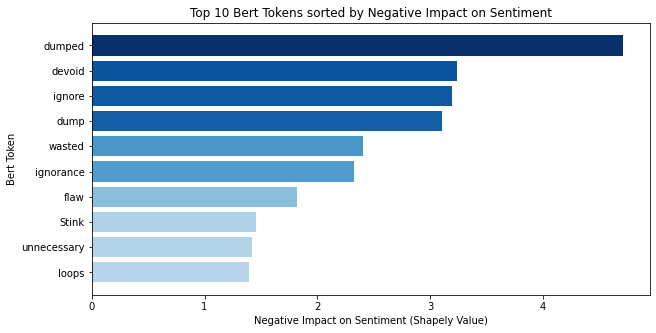

In [12]:
cmap_blue = plt.get_cmap("Blues")
rescale = lambda y: 0.3 + (y - np.min(y)) / (np.max(y) - np.min(y))

plt.figure(figsize = (10, 5))
plt.barh(plot_asc_names, plot_asc_vals, color = cmap_blue(rescale(plot_asc_vals)))
plt.ylabel("Bert Token") 
plt.xlabel("Negative Impact on Sentiment (Shapely Value)")
plt.title("Top 10 Bert Tokens sorted by Negative Impact on Sentiment")

plt.show()

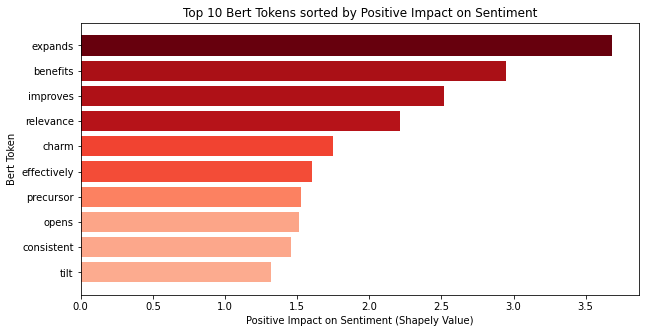

In [13]:
cmap_red = plt.get_cmap("Reds")
rescale = lambda y: 0.3 + (y - np.min(y)) / (np.max(y) - np.min(y))

plt.figure(figsize = (10, 5))
plt.barh(plot_desc_names, plot_desc_vals, color = cmap_red(rescale(plot_asc_vals)))
plt.ylabel("Bert Token") 
plt.xlabel("Positive Impact on Sentiment (Shapely Value)")
plt.title("Top 10 Bert Tokens sorted by Positive Impact on Sentiment")

plt.show()

In [14]:
# plot the first sentence's explanation
shap.plots.text(shap_values[4])

In [ ]:
shap.plots.text(shap_values)